<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#dhSegment-demonstration" data-toc-modified-id="dhSegment-demonstration-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>dhSegment demonstration</a></span><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Setup</a></span></li><li><span><a href="#Preparing-the-data" data-toc-modified-id="Preparing-the-data-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Preparing the data</a></span></li><li><span><a href="#Training-the-model" data-toc-modified-id="Training-the-model-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Training the model</a></span></li><li><span><a href="#Inference-and-new-annotations" data-toc-modified-id="Inference-and-new-annotations-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Inference and new annotations</a></span></li></ul></li></ul></div>

<a href="https://colab.research.google.com/github/dhlab-epfl/dhSegment-torch/blob/master/demo/dhSegment_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# dhSegment demonstration

This notebook will show a demonstration which will:
1. Read an set of annotated images and produce the necessary data for training dhSegment
2. Train a dhSegment model
3. Use the dhSegment model to infer a semantic segmentation map

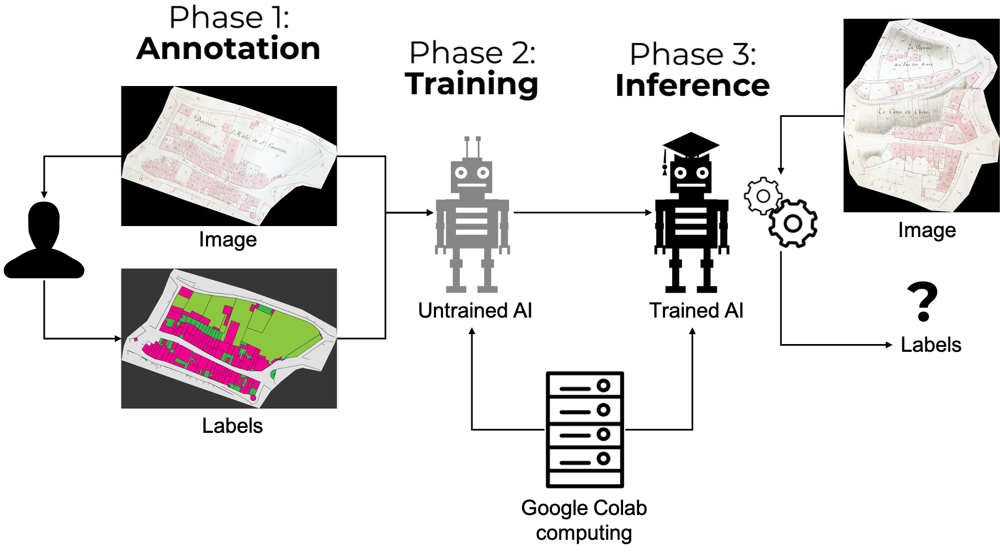

All you have to do is run the cells one by one, from first to last, using the arrow located at the top left corner of each cell.

## Setup

### Install requirements

The first 3 cells install dhSegment on the colab notebook, make the necessary imports and load the tensorboard extension to see the training process.

#### dhSegment will not work properly if the dependencies are not respected. In particular, inaccurate dependencies may result in an inability to converge, even if no error is displayed. Therefore, we highly recommend to create a dedicated environment as following :

    conda env create -f dh_segment_torch.yml

In [1]:
!pip install git+https://github.com/martinblech/xmltodict@master
!pip install git+https://github.com/dhlab-epfl/dhSegment-torch.git@master

  Cloning https://github.com/martinblech/xmltodict (to revision master) to /tmp/pip-req-build-dh7vyc9b
  Running command git clone -q https://github.com/martinblech/xmltodict /tmp/pip-req-build-dh7vyc9b
  Created wheel for xmltodict: filename=xmltodict-0.13.0-py2.py3-none-any.whl size=10076 sha256=d53861b389d77d95bce9b6d84f1df38a904bf8540fab4a35aed6646be79f8762
  Stored in directory: /tmp/pip-ephem-wheel-cache-zb6u9mkk/wheels/6e/32/96/03be449a3fa4ea9ba39d14280b9bd9775d82a007386d6146b9
Successfully built xmltodict
  Cloning https://github.com/dhlab-epfl/dhSegment-torch.git (to revision master) to /tmp/pip-req-build-1ol_gyy_
  Running command git clone -q https://github.com/dhlab-epfl/dhSegment-torch.git /tmp/pip-req-build-1ol_gyy_
  Using cached https://files.pythonhosted.org/packages/30/c0/d0526314971fc661b083ab135747dc68446a3022686da8c16d25fcf6ef07/lxml-4.6.3-cp37-cp37m-manylinux2014_x86_64.whl
     |████████████████████████████████| 645kB 22.6MB/s eta 0:00:01


     |████████████████████████████████| 61kB 30.4MB/s eta 0:00:01
  Created wheel for dh-segment-torch: filename=dh_segment_torch-0.1.0-cp37-none-any.whl size=171574 sha256=46a09ae1c782c5bc0e0ac78278e1974562bede69d1f0d647a2c0ac6c9986a9bd
  Stored in directory: /tmp/pip-ephem-wheel-cache-c_zamnd4/wheels/6e/ac/4f/73d88eab85914d7b5ca20c38a413bcf35e40e30f55a6916b3f
Successfully built dh-segment-torch
  Found existing installation: lxml 4.9.1
    Uninstalling lxml-4.9.1:
      Successfully uninstalled lxml-4.9.1
  Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
  Found existing installation: idna 3.4
    Uninstalling idna-3.4:
      Successfully uninstalled idna-3.4


In [2]:
from dh_segment_torch.config import Params

from dh_segment_torch.data import DataSplitter
from dh_segment_torch.data.annotation import AnnotationWriter

from dh_segment_torch.training import Trainer

from dh_segment_torch.inference import PredictProcess
from dh_segment_torch.post_processing import PostProcessingPipeline

import os, glob, json, cv2, collections
import torch

import pandas as pd
import numpy as np
from PIL import Image, ImageDraw, ImageColor

import cv2, glob, os, xmltodict, collections
import xml.etree.ElementTree as ET

## Preparing the data

The following cell contains the parameters for loading the data and creating the necessary data for training.

Important parameters are
- `file_path` which is the path to the annotation file.
- `attrib_name` which is the name of the attribute to consider in the via file
- `images_dir` which is the directory containing the images (if not using iiif)

Prior to running this cell, you should ensure that the images and annotated labels are found in your Google drive folder, in two separate folders `images`, respectively `labels`, found in your specific `data_path`.

To see if the file are there, you can click on the folder icon in the left panel and mount your own GDrive account.

In [3]:
params = {
    'data_path' : 'data', # Path to write the data
    'data_splitter': {'train_ratio': 0.8, 'val_ratio': 0.2, 'test_ratio': 0.0}, # splitting ratio of the data
    'copy_images': True, # Whether to copy the images
    'overwrite': True, # Whether to overwrite the images
    'progress': True # Whether to show progress
}

data_path = params.pop("data_path")

color_label = {
    'path': os.path.join(data_path, "color_labels.json"),
    'colors': {
        'background': [0,0,0], # RGB
        'cardboard': [255,0,0], # RGB
        'picture': [0,0,255] # RGB
    }
}

CVAT_convert = {
    'convert_from_CVAT': False,
    'lines_thickness': 0,
    'contours_thickness': 0,
    'contours_color': '#FFFFFF'
}

### Process parameters

The following cell prepares the data according to the parameters defined above.

In [4]:
num_processes = params.pop("num_processes", 4)

relative_path = params.pop("relative_path", True)

params.setdefault("labels_dir", os.path.join(data_path, "labels"))
labels_dir = params.get("labels_dir")

params.setdefault("images_dir", os.path.join(data_path, "images"))
images_dir = params.get("images_dir")

params.setdefault("color_labels_file_path", os.path.join(data_path, "color_labels.json"))
params.setdefault("csv_path", os.path.join(data_path, "data.csv"))

data_splitter_params = params.pop("data_splitter", None)
train_csv_path = params.pop("train_csv", os.path.join(data_path, "train.csv"))
val_csv_path = params.pop("val_csv", os.path.join(data_path, "val.csv"))
test_csv_path = params.pop("test_csv", os.path.join(data_path, "test.csv"))

params.setdefault("type", "image")

if CVAT_convert['convert_from_CVAT']:
    classes, images_list, labels_list = drawCVATdataset(data_path, 
          CVAT_convert['lines_thickness'], CVAT_convert['contours_thickness'], 
          CVAT_convert['contours_color'])
    labels_dir = labels_list[0][:-1-len(labels_list[0].split('/')[-1])]
    images_dir = images_list[0][:-1-len(images_list[0].split('/')[-1])]
    color_label['colors'] = classes

else:
    labels_list = sorted(glob.glob(os.path.join(labels_dir, '*.*')))
    images_list = sorted(glob.glob(os.path.join(images_dir, '*.*')))

data = pd.DataFrame({'image': images_list, 'label': labels_list})
data.to_csv(params['csv_path'], header=False, index=False)

if relative_path:
    data['image'] = data['image'].apply(lambda path: os.path.join("images", os.path.basename(path)))
    data['label'] = data['label'].apply(lambda path: os.path.join("labels", os.path.basename(path)))

if data_splitter_params:
    data_splitter = DataSplitter.from_params(data_splitter_params)
    data_splitter.split_data(data, train_csv_path, val_csv_path, test_csv_path)

for class_name in color_label['colors'].keys():
    if type(color_label['colors'][class_name]) == str:
        color_label['colors'][class_name] = list(ImageColor.getcolor(
            color_label['colors'][class_name], "RGB"))

with open(color_label['path'], 'w') as outfile:
    json.dump({'colors': list(color_label['colors'].values()),
              'one_hot_encoding': None,
              'labels': list(color_label['colors'].keys())}, outfile)

## Training the model

The following cell contains the configuration for the model and its training.

The defaults should be fine for most use cases.

The only parameter that may require tweaking is the batch size that needs to be set according to the amount of memory the GPU has. For 15-16 GB of memory (what you normally get on Colab), a batch size of 4 is fine for images of c.a. 1M pixels (1000x1000), otherwise a batch size of 2 or less should be set.

### Parameters

In [5]:
params = {
        "color_labels": {"label_json_file": os.path.join(data_path, "color_labels.json")}, # Color labels produced before
        "train_dataset": {
            "type": "image_csv", # Image csv dataset
            "csv_filename":  os.path.join(data_path, "train.csv"),
            "base_dir": data_path,
            "repeat_dataset": 1,
            "compose": {"transforms": []}#[{"type": "fixed_size_resize", "output_size": 7.5e5}]} # Resize to a fixed size, could add other transformations.
        },
        "val_dataset": {
            "type": "image_csv", # Validation dataset
            "csv_filename": os.path.join(data_path, "val.csv"),
            "base_dir": data_path,
            "compose": {"transforms": []}#[{"type": "fixed_size_resize", "output_size": 7.5e5}]} # Resize to a fixed size, could add other transformations.
        },
        "model": { # Model definition, original dhSegment
            "encoder": "resnet50", 
            "decoder": {
                "decoder_channels": [512, 256, 128, 64, 32],
                "max_channels": 512
            }
        },
        "metrics": [['miou', 'iou'], ['iou', {"type": 'iou', "average": None}], 'precision'], # Metrics to compute
        "optimizer": {"lr": 5e-5}, # Learning rate
        "lr_scheduler": {"type": "exponential", "gamma": 0.9995}, # Exponential decreasing learning rate
        "val_metric": "+miou", # Metric to observe to consider a model better than another, the + indicates that we want to maximize
        "early_stopping": {"patience": 50}, # Number of validation steps without increase to tolerate, stops if reached
        "model_out_dir": "models", # Path to model output
        "num_epochs": 200, # Number of epochs for training
        "evaluate_every_epoch": 2, # Number of epochs between each validation of the model
        "batch_size": 4, # Batch size (to be changed if the allocated GPU has little memory)
        "num_data_workers": 0,
        "track_train_metrics": False,
        "loggers": [
           {"type": 'tensorboard', "log_dir": "tensorboard/log", 
            "log_every": 25, "log_images_every": 100}, # Tensorboard logging
           ]
    }


### Start training

The following cell generates the trainer from the parameters defined above and trains the model.

The training process can then be observed in the below tensorboard window.

The can be interrupted if a good enough result has been obtained has checkpoints are automatically created.

In [6]:
trainer = Trainer.from_params(params)
trainer.train()

epoch 0: loss=???:   0%|          | 0/200 [00:00<?, ?it/s]

iter=0: loss=???: 0it [00:00, ?it/s]

iter=9: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=18: loss=???: 0it [00:00, ?it/s]

iter=27: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=36: loss=???: 0it [00:00, ?it/s]

iter=45: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=54: loss=???: 0it [00:00, ?it/s]

iter=63: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=72: loss=???: 0it [00:00, ?it/s]

iter=81: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=90: loss=???: 0it [00:00, ?it/s]

iter=99: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=108: loss=???: 0it [00:00, ?it/s]

iter=117: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=126: loss=???: 0it [00:00, ?it/s]

iter=135: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=144: loss=???: 0it [00:00, ?it/s]

iter=153: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=162: loss=???: 0it [00:00, ?it/s]

iter=171: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=180: loss=???: 0it [00:00, ?it/s]

iter=189: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=198: loss=???: 0it [00:00, ?it/s]

iter=207: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=216: loss=???: 0it [00:00, ?it/s]

iter=225: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=234: loss=???: 0it [00:00, ?it/s]

iter=243: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=252: loss=???: 0it [00:00, ?it/s]

iter=261: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=270: loss=???: 0it [00:00, ?it/s]

iter=279: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=288: loss=???: 0it [00:00, ?it/s]

iter=297: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=306: loss=???: 0it [00:00, ?it/s]

iter=315: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=324: loss=???: 0it [00:00, ?it/s]

iter=333: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=342: loss=???: 0it [00:00, ?it/s]

iter=351: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=360: loss=???: 0it [00:00, ?it/s]

iter=369: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.980.pth and models/best_model_checkpoint_miou=0.980.pth but did not exist


iter=378: loss=???: 0it [00:00, ?it/s]

iter=387: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=396: loss=???: 0it [00:00, ?it/s]

iter=405: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=414: loss=???: 0it [00:00, ?it/s]

iter=423: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=432: loss=???: 0it [00:00, ?it/s]

iter=441: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=450: loss=???: 0it [00:00, ?it/s]

iter=459: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=468: loss=???: 0it [00:00, ?it/s]

iter=477: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=486: loss=???: 0it [00:00, ?it/s]

iter=495: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=504: loss=???: 0it [00:00, ?it/s]

iter=513: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=522: loss=???: 0it [00:00, ?it/s]

iter=531: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.989.pth and models/best_model_checkpoint_miou=0.989.pth but did not exist


iter=540: loss=???: 0it [00:00, ?it/s]

iter=549: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=558: loss=???: 0it [00:00, ?it/s]

iter=567: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=576: loss=???: 0it [00:00, ?it/s]

iter=585: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=594: loss=???: 0it [00:00, ?it/s]

iter=603: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=612: loss=???: 0it [00:00, ?it/s]

iter=621: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.991.pth and models/best_model_checkpoint_miou=0.991.pth but did not exist


iter=630: loss=???: 0it [00:00, ?it/s]

iter=639: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=648: loss=???: 0it [00:00, ?it/s]

iter=657: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=666: loss=???: 0it [00:00, ?it/s]

iter=675: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.991.pth and models/best_model_checkpoint_miou=0.991.pth but did not exist


iter=684: loss=???: 0it [00:00, ?it/s]

iter=693: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=702: loss=???: 0it [00:00, ?it/s]

iter=711: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=720: loss=???: 0it [00:00, ?it/s]

iter=729: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=738: loss=???: 0it [00:00, ?it/s]

iter=747: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=756: loss=???: 0it [00:00, ?it/s]

iter=765: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.991.pth and models/best_model_checkpoint_miou=0.991.pth but did not exist


iter=774: loss=???: 0it [00:00, ?it/s]

iter=783: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=792: loss=???: 0it [00:00, ?it/s]

iter=801: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=810: loss=???: 0it [00:00, ?it/s]

iter=819: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=828: loss=???: 0it [00:00, ?it/s]

iter=837: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=846: loss=???: 0it [00:00, ?it/s]

iter=855: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.991.pth and models/best_model_checkpoint_miou=0.991.pth but did not exist


iter=864: loss=???: 0it [00:00, ?it/s]

iter=873: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=882: loss=???: 0it [00:00, ?it/s]

iter=891: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=900: loss=???: 0it [00:00, ?it/s]

iter=909: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=918: loss=???: 0it [00:00, ?it/s]

iter=927: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=936: loss=???: 0it [00:00, ?it/s]

iter=945: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=954: loss=???: 0it [00:00, ?it/s]

iter=963: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.992.pth and models/best_model_checkpoint_miou=0.992.pth but did not exist


iter=972: loss=???: 0it [00:00, ?it/s]

iter=981: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=990: loss=???: 0it [00:00, ?it/s]

iter=999: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.992.pth and models/best_model_checkpoint_miou=0.992.pth but did not exist


iter=1008: loss=???: 0it [00:00, ?it/s]

iter=1017: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1026: loss=???: 0it [00:00, ?it/s]

iter=1035: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1044: loss=???: 0it [00:00, ?it/s]

iter=1053: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.993.pth and models/best_model_checkpoint_miou=0.993.pth but did not exist


iter=1062: loss=???: 0it [00:00, ?it/s]

iter=1071: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1080: loss=???: 0it [00:00, ?it/s]

iter=1089: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.993.pth and models/best_model_checkpoint_miou=0.993.pth but did not exist


iter=1098: loss=???: 0it [00:00, ?it/s]

iter=1107: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1116: loss=???: 0it [00:00, ?it/s]

iter=1125: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1134: loss=???: 0it [00:00, ?it/s]

iter=1143: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1152: loss=???: 0it [00:00, ?it/s]

iter=1161: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1170: loss=???: 0it [00:00, ?it/s]

iter=1179: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.993.pth and models/best_model_checkpoint_miou=0.993.pth but did not exist


iter=1188: loss=???: 0it [00:00, ?it/s]

iter=1197: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1206: loss=???: 0it [00:00, ?it/s]

iter=1215: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1224: loss=???: 0it [00:00, ?it/s]

iter=1233: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1242: loss=???: 0it [00:00, ?it/s]

iter=1251: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1260: loss=???: 0it [00:00, ?it/s]

iter=1269: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.993.pth and models/best_model_checkpoint_miou=0.993.pth but did not exist


iter=1278: loss=???: 0it [00:00, ?it/s]

iter=1287: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1296: loss=???: 0it [00:00, ?it/s]

iter=1305: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1314: loss=???: 0it [00:00, ?it/s]

iter=1323: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1332: loss=???: 0it [00:00, ?it/s]

iter=1341: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1350: loss=???: 0it [00:00, ?it/s]

iter=1359: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1368: loss=???: 0it [00:00, ?it/s]

iter=1377: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.994.pth and models/best_model_checkpoint_miou=0.994.pth but did not exist


iter=1386: loss=???: 0it [00:00, ?it/s]

iter=1395: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1404: loss=???: 0it [00:00, ?it/s]

iter=1413: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1422: loss=???: 0it [00:00, ?it/s]

iter=1431: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1440: loss=???: 0it [00:00, ?it/s]

iter=1449: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1458: loss=???: 0it [00:00, ?it/s]

iter=1467: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.994.pth and models/best_model_checkpoint_miou=0.994.pth but did not exist


iter=1476: loss=???: 0it [00:00, ?it/s]

iter=1485: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1494: loss=???: 0it [00:00, ?it/s]

iter=1503: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1512: loss=???: 0it [00:00, ?it/s]

iter=1521: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1530: loss=???: 0it [00:00, ?it/s]

iter=1539: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1548: loss=???: 0it [00:00, ?it/s]

iter=1557: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1566: loss=???: 0it [00:00, ?it/s]

iter=1575: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1584: loss=???: 0it [00:00, ?it/s]

iter=1593: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1602: loss=???: 0it [00:00, ?it/s]

iter=1611: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1620: loss=???: 0it [00:00, ?it/s]

iter=1629: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1638: loss=???: 0it [00:00, ?it/s]

iter=1647: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1656: loss=???: 0it [00:00, ?it/s]

iter=1665: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

Tried to delete models/best_trainer_checkpoint_miou=0.995.pth and models/best_model_checkpoint_miou=0.995.pth but did not exist


iter=1674: loss=???: 0it [00:00, ?it/s]

iter=1683: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1692: loss=???: 0it [00:00, ?it/s]

iter=1701: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1710: loss=???: 0it [00:00, ?it/s]

iter=1719: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1728: loss=???: 0it [00:00, ?it/s]

iter=1737: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1746: loss=???: 0it [00:00, ?it/s]

iter=1755: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1764: loss=???: 0it [00:00, ?it/s]

iter=1773: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

iter=1782: loss=???: 0it [00:00, ?it/s]

iter=1791: loss=???: 0it [00:00, ?it/s]

Evaluating: 0it [00:00, ?it/s]

The following cell will start and launch a Tensorboard instance. If it fails, relaunch the cell and wait until you see the Tensorboard orange bar.

In [11]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [21]:
%tensorboard --logdir tensorboard/log

Reusing TensorBoard on port 6006 (pid 561983), started 0:03:10 ago. (Use '!kill 561983' to kill it.)

## Inference

The inference corresponds to the production stage. It allows the neural network to work on images it has never "seen" before. It makes predictions on these images which are translated into the form of probability maps. By displaying only the maximum probability for each pixel, the optimal result is obtained. This result can then be stored for further computer manipulation, such as creating a database or digital collection.

### Parameters

In [14]:
dataset_params = {
    "type": "folder",
    "folder": "data/images",
    "pre_processing": {"transforms": []}#{"type": "fixed_size_resize", "output_size": 1e6}]}
}

model_params = {
    "model": {
            "encoder": "resnet50",
            "decoder": {"decoder_channels": [512, 256, 128, 64, 32], "max_channels": 512}
        },
        "num_classes": 3,
        "model_state_dict": sorted(glob.glob("models/best_model_checkpoint_miou=*.pth"))[-1],
        "device": "cuda:0"
}

process_params = Params({
    'data': dataset_params,
    'model': model_params,
    'batch_size': 4,
    'num_workers': 4,
    'add_path': True
})

### Compute prediction

In [15]:
output_dir = "predictions"
os.makedirs(output_dir, exist_ok=True)
predict_annots = PredictProcess.from_params(process_params)
predict_annots.process_to_probas_files(output_dir)
results = [np.load(path) for path in sorted(glob.glob(os.path.join(output_dir, '*.npy')))]
images = [cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB) for path in sorted(glob.glob(os.path.join(data_path, 'images', '*.*')))]

  0%|          | 0/12 [00:00<?, ?it/s]

#### Image
Choose an image (`image_nb`) for which you want to check the result

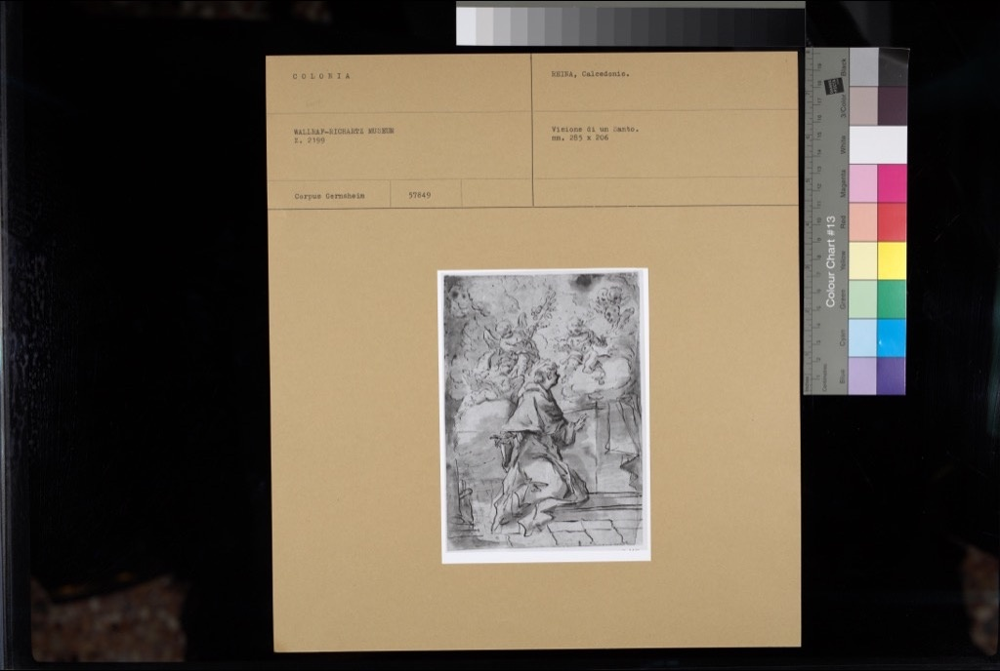

In [16]:
image_nb = 5
Image.fromarray(images[image_nb])

#### Probability map
For a given class (`class_nb`). The lighter pixels correspond to a higher class probability

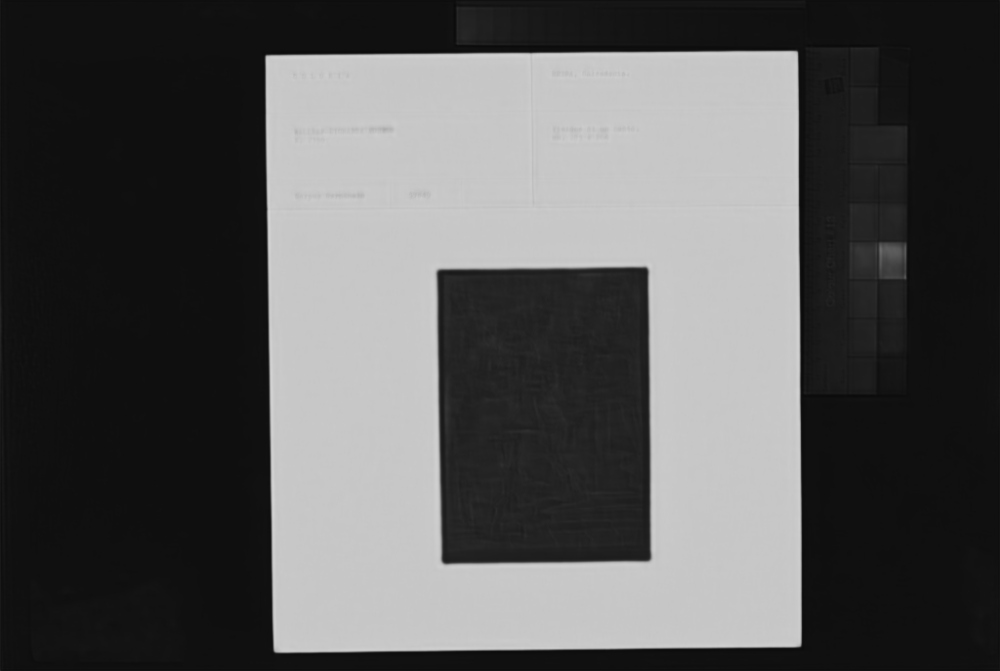

In [22]:
class_nb = 1
Image.fromarray((np.around(results[image_nb][class_nb]*255)).astype('uint8'))

#### Most probable classes

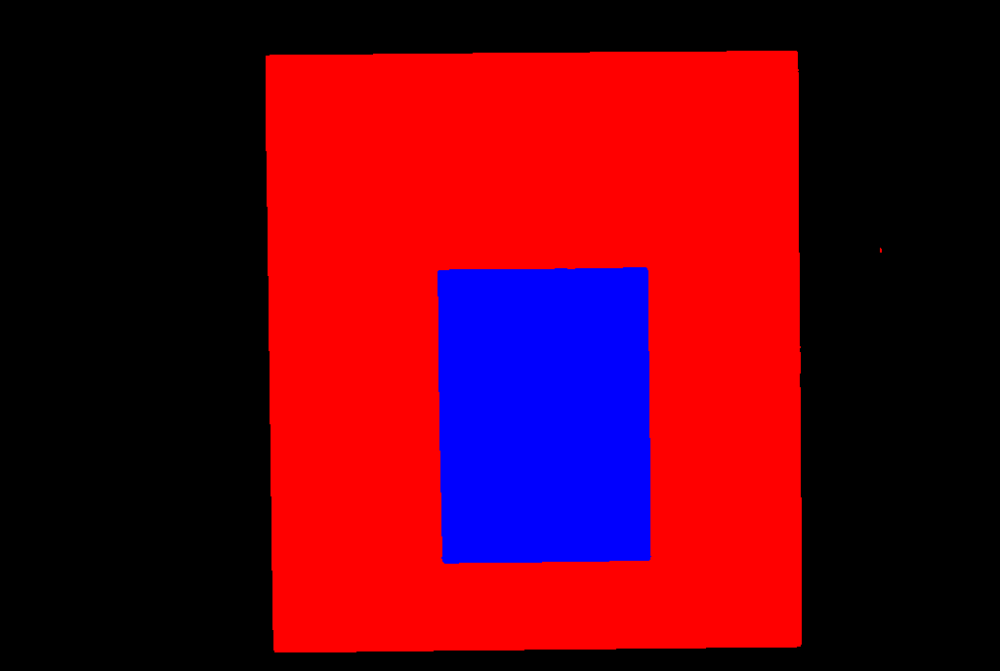

In [23]:
image = np.argmax(results[image_nb], axis=0).astype('uint8')
colors = list(color_label['colors'].values())
canvas = np.zeros((image.shape[0], image.shape[1], 3)).astype('uint8')
for i, color in enumerate(colors):
  canvas[image == i] = color
Image.fromarray(canvas)

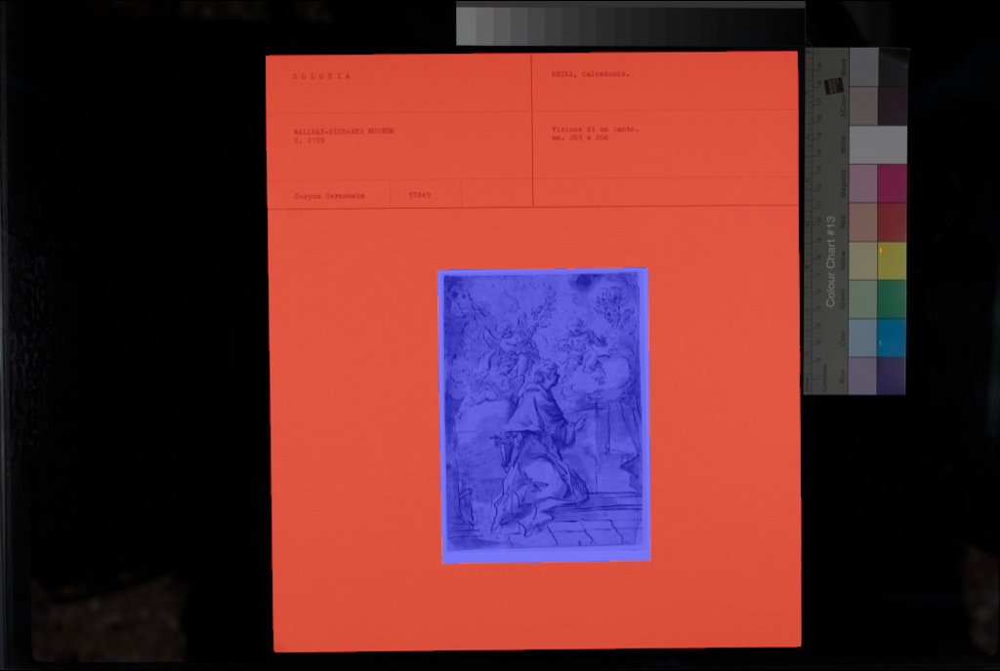

In [24]:
Image.fromarray(canvas//2 + images[image_nb]//2)

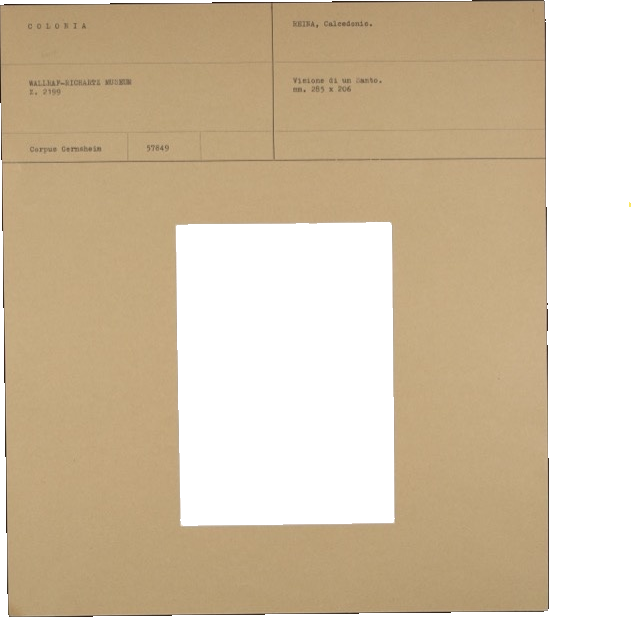

In [25]:
mask = (image == class_nb).astype('uint8')*255
x, y, w, h = cv2.boundingRect(mask)
cut = cv2.merge((images[image_nb], mask))[y:y+h, x:x+w]
Image.fromarray(cut)